In [1]:
import seaborn as sns
import pandas as pd
import requests
import zipfile
import io
from sklearn.preprocessing import LabelEncoder

In [2]:
dataset = {
        "name": "bank",
        "url": "https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank.zip",
        "categorical_columns": "job,marital,education,default,housing,loan,contact,month,poutcome,yesno", 
        "columns":"age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno",
        "target": "yesno",
        "header": "t",
        "sep": ";",
        "imbalanced": "t",
        "zipped": "t",
        "zip_name": "bank-full.csv"
    }

sep = dataset['sep']
index_col = False
names = dataset['columns'].split(',')
r = requests.post(dataset['url']) if dataset['zipped'] == 'f' else requests.get(dataset['url'])
z = None if dataset['zipped'] == 'f' else zipfile.ZipFile(io.BytesIO(r.content))
skiprow = 1 if dataset['header'] == "t" else 0
if r.ok:
	data = io.StringIO(r.content.decode('utf8')) if dataset['zipped'] == 'f' else z.open(dataset['zip_name'])
	df = pd.read_csv(data, names=names, sep=sep, index_col=index_col, skiprows=skiprow)
else:
	raise "Unable to retrieve dataset: " + dataset

def select_column(scol):
	return scol.split(',')
    
encoders = {}
if dataset['categorical_columns'] != "":
	for column in select_column(dataset['categorical_columns']):
		encoders[column] = LabelEncoder()
		df[column] = encoders[column].fit_transform(df[column])

In [3]:
bank = df
bank_ctgan = pd.read_csv("results/ctgan_10_bank_dpbench_run_dataset.csv", index_col=0)
bank_patectgan = pd.read_csv("results/patectgan_10_bank_dpbench_run_dataset.csv", index_col=0)
bank_wpatectdragan = pd.read_csv("results/wpatectdragan_10_bank_dpbench_run_dataset.csv", index_col=0)

In [16]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno,dataset
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0,bank
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0,bank
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0,bank
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0,bank
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0,bank


In [4]:
bank.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,4.339762,1.167725,1.224813,0.018027,1362.272058,0.555838,0.160226,0.640242,15.806419,5.523014,258.163080,2.763841,40.197828,0.580323,2.559974,0.116985
std,10.618762,3.272657,0.608230,0.747997,0.133049,3044.765829,0.496878,0.366820,0.897951,8.322476,3.006911,257.527812,3.098021,100.128746,2.303441,0.989059,0.321406
min,18.000000,0.000000,0.000000,0.000000,0.000000,-8019.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,-1.000000,0.000000,0.000000,0.000000
25%,33.000000,1.000000,1.000000,1.000000,0.000000,72.000000,0.000000,0.000000,0.000000,8.000000,3.000000,103.000000,1.000000,-1.000000,0.000000,3.000000,0.000000
50%,39.000000,4.000000,1.000000,1.000000,0.000000,448.000000,1.000000,0.000000,0.000000,16.000000,6.000000,180.000000,2.000000,-1.000000,0.000000,3.000000,0.000000
75%,48.000000,7.000000,2.000000,2.000000,0.000000,1428.000000,1.000000,0.000000,2.000000,21.000000,8.000000,319.000000,3.000000,-1.000000,0.000000,3.000000,0.000000
max,95.000000,11.000000,2.000000,3.000000,1.000000,102127.000000,1.000000,1.000000,2.000000,31.000000,11.000000,4918.000000,63.000000,871.000000,275.000000,3.000000,1.000000


In [17]:
bank_ctgan.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno,dataset
0,81.767526,5.0,1.0,1.0,0.0,2671.306825,0.0,0.0,1.0,17.210295,9.0,356.128959,2.012305,-0.844212,0.004326,3.0,0.0,ctgan
1,56.104923,5.0,1.0,0.0,0.0,470.392966,1.0,1.0,0.0,13.132393,5.0,110.891447,7.134703,-1.096873,0.004398,3.0,0.0,ctgan
2,46.617992,7.0,1.0,1.0,0.0,123.387247,1.0,0.0,0.0,16.804031,0.0,522.629753,1.010140,-1.476672,0.002589,3.0,0.0,ctgan
3,40.062738,7.0,1.0,1.0,0.0,1110.894906,0.0,0.0,2.0,5.169114,6.0,368.130732,5.432755,-0.335417,0.006284,3.0,0.0,ctgan
4,27.229222,9.0,2.0,1.0,0.0,2750.887008,0.0,0.0,0.0,1.157673,6.0,301.200033,2.010478,-1.086365,0.001707,3.0,0.0,ctgan


In [6]:
bank_patectgan.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.654111,4.555197,1.133021,1.295680,0.031696,1265.871181,0.574086,0.140541,0.133596,14.241919,5.812214,232.990265,1.817935,155.713073,2.877402,0.574307,0.188848
std,10.489651,3.337331,0.643172,0.777295,0.175191,2301.715092,0.494486,0.347551,0.404768,7.921296,3.464988,220.838070,1.338007,96.815746,2.439478,0.790442,0.391392
min,15.828622,0.000000,0.000000,0.000000,0.000000,-9881.974101,0.000000,0.000000,0.000000,-0.967764,0.000000,-61.580746,0.927864,-83.808453,-0.022826,0.000000,0.000000
25%,32.929894,1.000000,1.000000,1.000000,0.000000,89.000229,0.000000,0.000000,0.000000,7.622907,3.000000,96.808442,1.003412,87.416201,1.062719,0.000000,0.000000
50%,38.983818,4.000000,1.000000,1.000000,0.000000,623.287788,1.000000,0.000000,0.000000,14.596777,6.000000,179.021925,1.038648,161.314580,2.048324,0.000000,0.000000
75%,47.879644,8.000000,2.000000,2.000000,0.000000,1593.767195,1.000000,0.000000,0.000000,19.795755,9.000000,296.881458,2.023521,192.271426,3.201598,1.000000,0.000000
max,99.019861,11.000000,2.000000,3.000000,1.000000,41729.542345,1.000000,1.000000,2.000000,33.091377,11.000000,2808.982377,36.690126,653.117087,17.651036,3.000000,1.000000


In [7]:
bank_wpatectdragan.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,yesno
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,41.998180,4.597664,1.150362,1.259450,0.053306,1319.079916,0.592466,0.134657,0.419610,16.530109,5.991971,322.492717,2.681680,51.601516,0.742892,2.349096,0.166973
std,11.212633,3.426911,0.613204,0.810633,0.224645,2822.701191,0.491381,0.341361,0.754439,8.767749,3.196610,301.993224,3.200880,109.163317,1.773918,1.106807,0.372956
min,16.117963,0.000000,0.000000,0.000000,0.000000,-12826.132631,0.000000,0.000000,0.000000,-0.817067,0.000000,-46.268113,0.936965,-17.603162,-0.031652,0.000000,0.000000
25%,33.403825,1.000000,1.000000,1.000000,0.000000,29.647425,0.000000,0.000000,0.000000,9.466062,4.000000,130.734343,1.013386,-1.309069,-0.004641,2.000000,0.000000
50%,40.489020,4.000000,1.000000,1.000000,0.000000,470.561005,1.000000,0.000000,0.000000,16.201163,7.000000,223.976995,1.999251,-0.976303,0.002602,3.000000,0.000000
75%,49.947554,8.000000,2.000000,2.000000,0.000000,1670.719736,1.000000,0.000000,1.000000,24.112441,8.000000,404.393884,3.004640,-0.357122,0.960979,3.000000,0.000000
max,99.509517,11.000000,2.000000,3.000000,1.000000,41940.228462,1.000000,1.000000,2.000000,33.205535,11.000000,2496.243689,38.253329,612.946656,13.992605,3.000000,1.000000


In [4]:
bank["dataset"] = "bank" 
bank_ctgan["dataset"] = "ctgan"
bank_patectgan["dataset"] = "patectgan"
bank_wpatectdragan["dataset"] = "wpatectdragan"

In [5]:
all_bank = pd.concat([bank, bank_ctgan, bank_patectgan, bank_wpatectdragan])

In [10]:
#sns.pairplot(all_bank, hue="dataset")

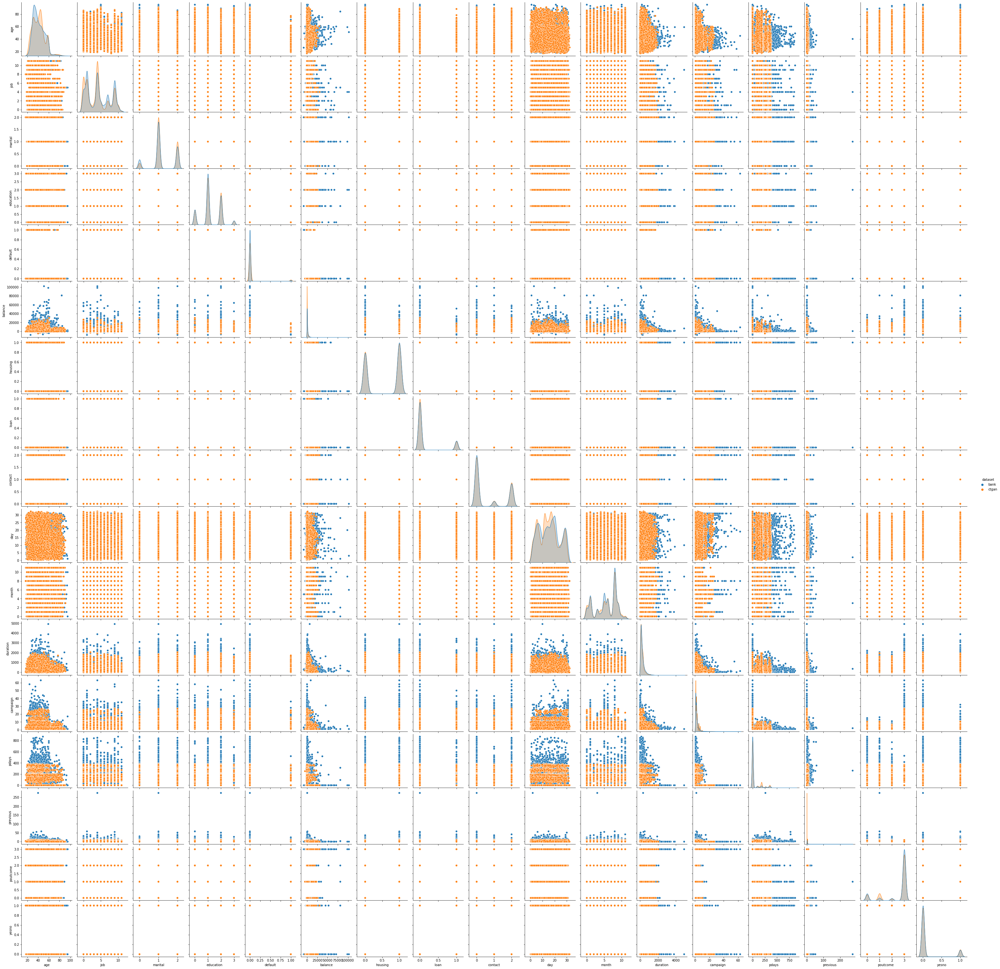

In [11]:
bank_vs_ctgan = pd.concat([bank, bank_ctgan])
sns.pairplot(bank_vs_ctgan, hue="dataset")

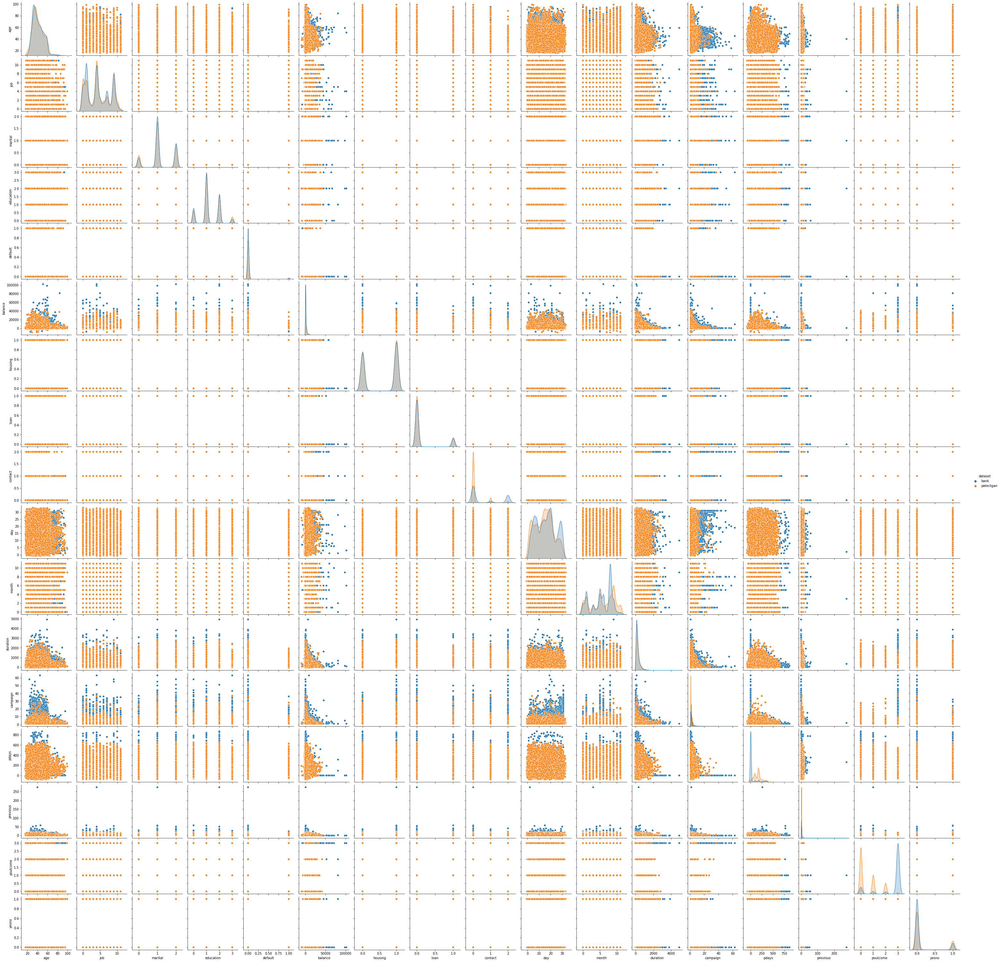

In [13]:
bank_vs_patectgan = pd.concat([bank, bank_patectgan])
sns.pairplot(bank_vs_patectgan, hue="dataset")

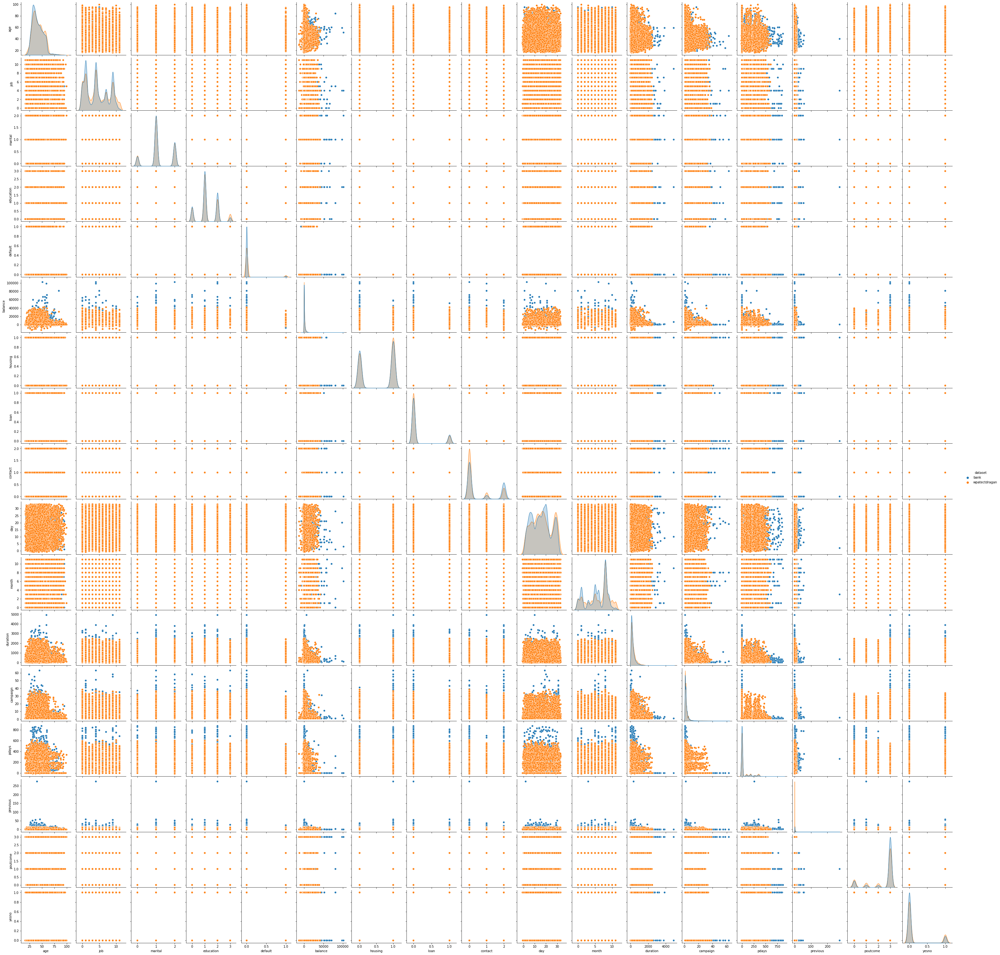

In [6]:
bank_vs_wpatectdragan = pd.concat([bank, bank_wpatectdragan])
sns.pairplot(bank_vs_wpatectdragan, hue="dataset")

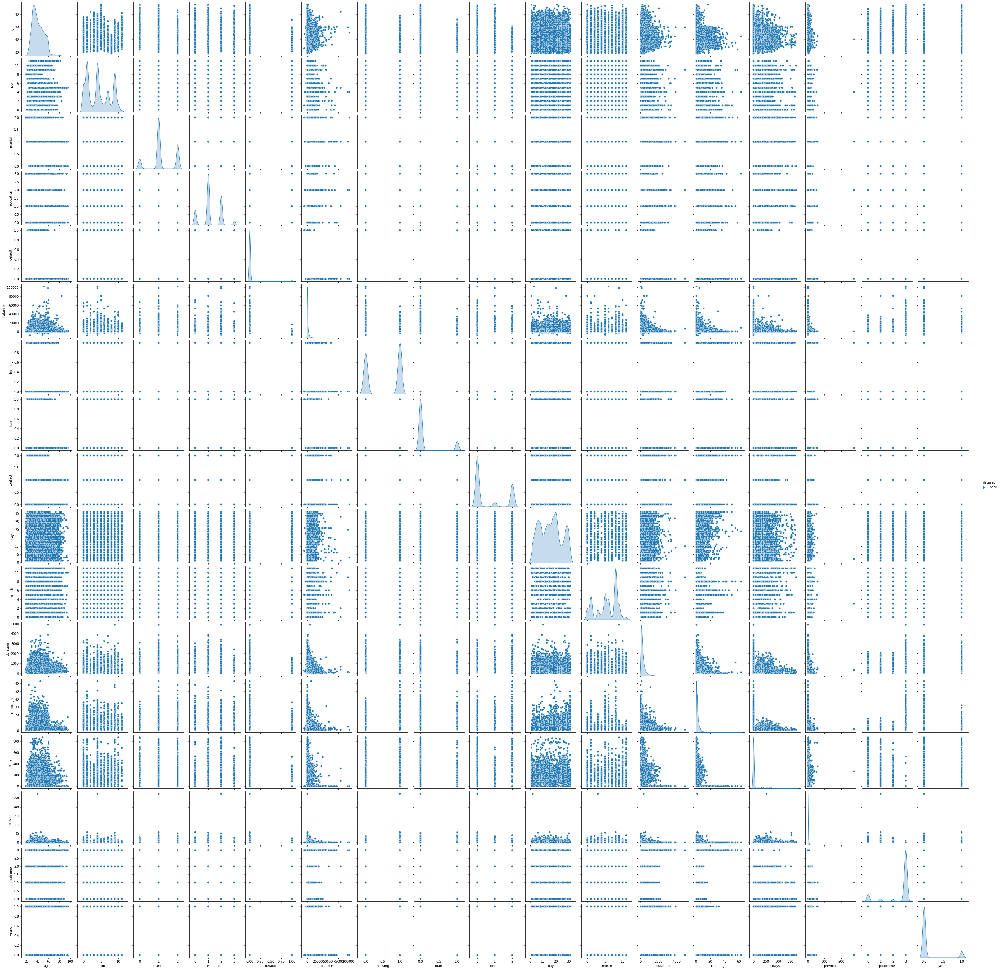

In [16]:
sns.pairplot(bank, hue="dataset")

In [5]:
bank_vs_wpatectdragan = pd.concat([bank, bank_wpatectdragan])
for column in select_column(dataset['categorical_columns']):
    bank_vs_wpatectdragan = bank_vs_wpatectdragan.drop(column, axis=1) 

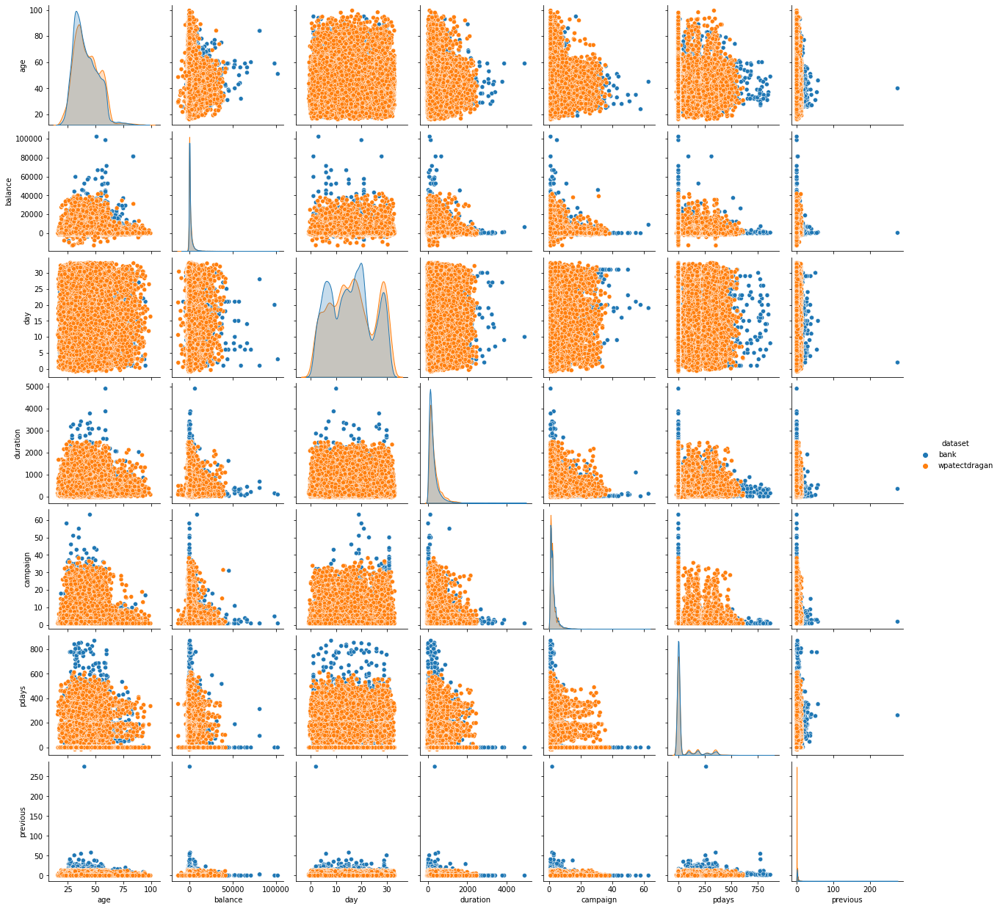

In [6]:
sns.pairplot(bank_vs_wpatectdragan, hue="dataset")

In [7]:
bank_vs_patectgan = pd.concat([bank, bank_patectgan])
for column in select_column(dataset['categorical_columns']):
    bank_vs_patectgan = bank_vs_patectgan.drop(column, axis=1)

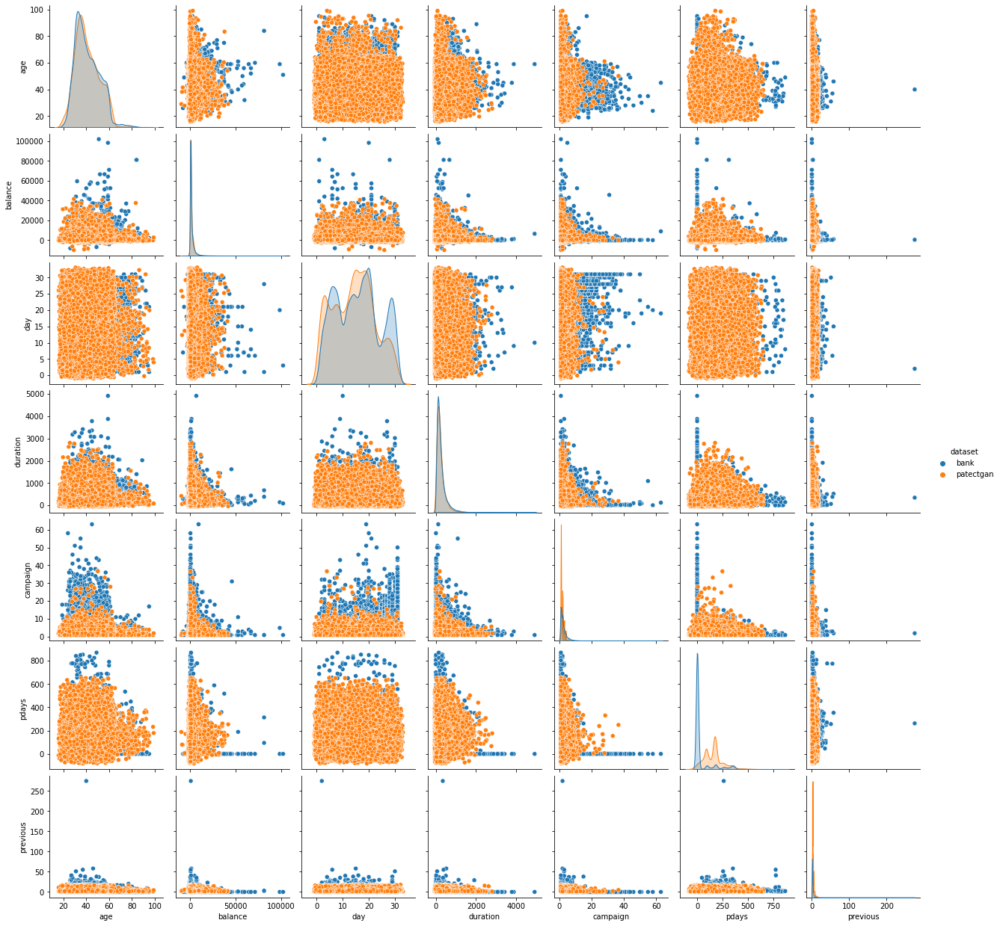

In [8]:
sns.pairplot(bank_vs_patectgan, hue="dataset")

In [9]:
direct_overlap = pd.concat([bank, bank_wpatectdragan, bank_patectgan])
for column in select_column(dataset['categorical_columns']):
    direct_overlap = direct_overlap.drop(column, axis=1) 

In [14]:
direct_overlap.head()

,age,balance,day,duration,campaign,pdays,previous,dataset
0,58.0,2143.0,5.0,261.0,1.0,-1.0,0.0,bank
1,44.0,29.0,5.0,151.0,1.0,-1.0,0.0,bank
2,33.0,2.0,5.0,76.0,1.0,-1.0,0.0,bank
3,47.0,1506.0,5.0,92.0,1.0,-1.0,0.0,bank
4,33.0,1.0,5.0,198.0,1.0,-1.0,0.0,bank


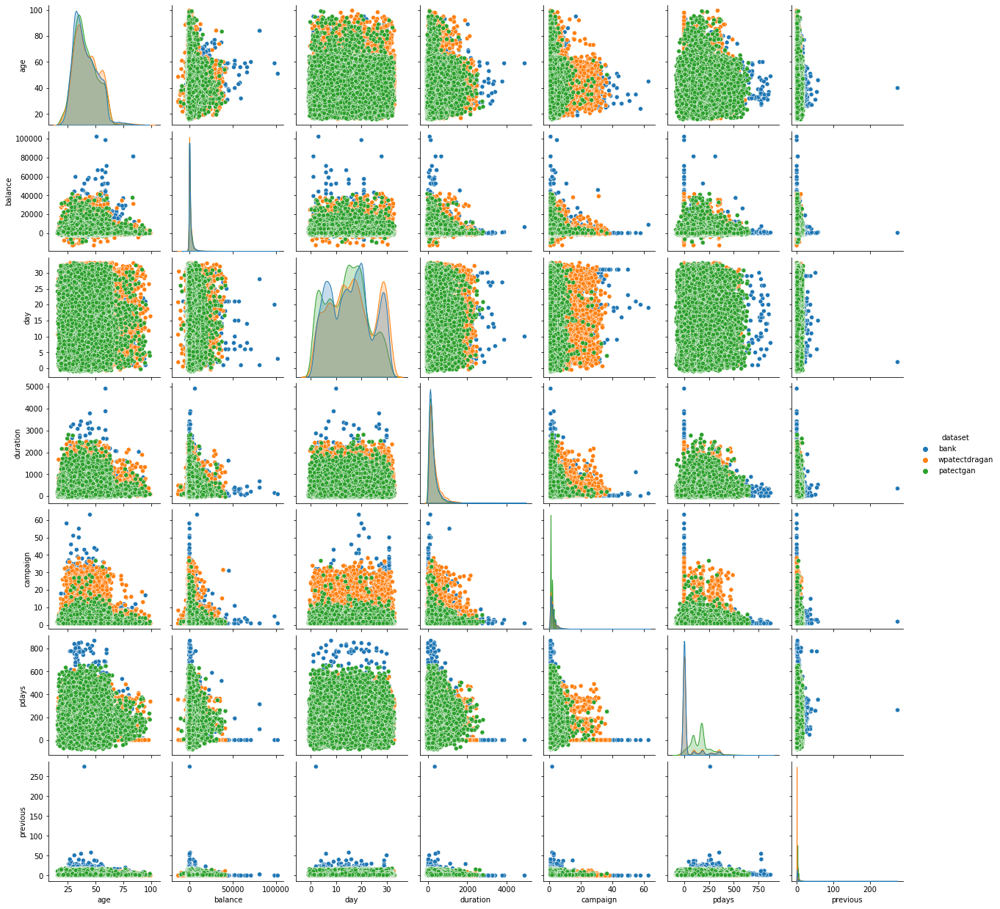

In [15]:
sns.pairplot(direct_overlap, hue="dataset")

In [17]:
bank_num = bank.copy()
for column in select_column(dataset['categorical_columns']):
    bank_num = bank_num.drop(column, axis=1) 

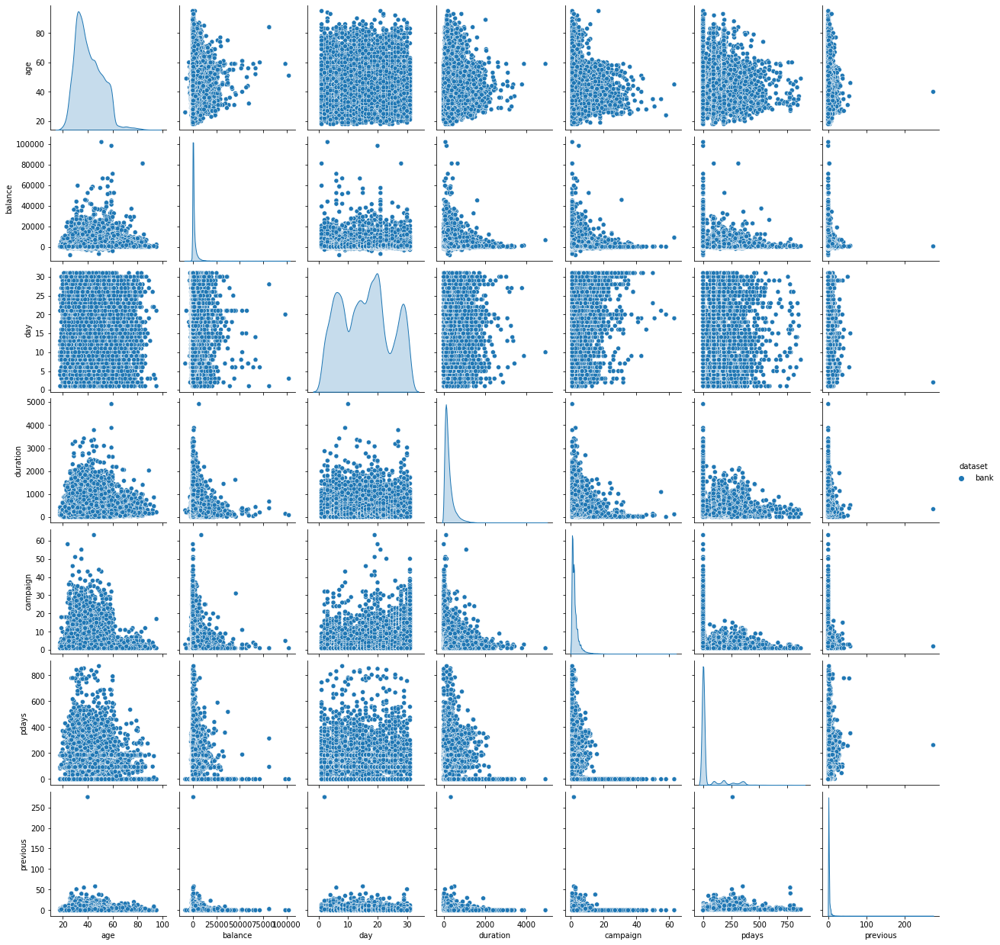

In [18]:
sns.pairplot(bank_num, hue="dataset")